In [1]:
import warnings
warnings.filterwarnings('ignore')

## Hierarchical clustering on gym members exercise

The dataset includes information on gym members' physical attributes and exercise habits. Here is a summary of the columns:

1. **Age**: Age of the gym member.
2. **Gender**: Gender (Male or Female).
3. **Weight (kg)**: Weight of the member in kilograms.
4. **Height (m)**: Height of the member in meters.
5. **Max_BPM**: Maximum beats per minute during exercise.
6. **Avg_BPM**: Average beats per minute during exercise.
7. **Resting_BPM**: Resting beats per minute.
8. **Session_Duration (hours)**: Length of workout session in hours.
9. **Calories_Burned**: Number of calories burned during the session.
10. **Workout_Type**: Type of workout (Yoga, HIIT, Cardio, Strength).
11. **Fat_Percentage**: Body fat percentage of the member.
12. **Water_Intake (liters)**: Water consumed during the session in liters.
13. **Workout_Frequency (days/week)**: How often the member works out per week.
14. **Experience_Level**: Experience level in working out (assumed scale from 1 to 3, where 1 is beginner and 3 is advanced).
15. **BMI**: Body Mass Index of the member.

In [2]:
import pandas as pd

# Load the dataset to perform exploratory data analysis (EDA)
file_path = 'gym_members_exercise_tracking.csv'
data = pd.read_csv(file_path)

# Display the first few rows of the dataset to understand its structure
data.head()

,Age,Gender,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Workout_Type,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI
0,56,Male,88.3,1.71,180,157,60,1.69,1313.0,Yoga,12.6,3.5,4,3,30.20
1,46,Female,74.9,1.53,179,151,66,1.30,883.0,HIIT,33.9,2.1,4,2,32.00
2,32,Female,68.1,1.66,167,122,54,1.11,677.0,Cardio,33.4,2.3,4,2,24.71
3,25,Male,53.2,1.70,190,164,56,0.59,532.0,Strength,28.8,2.1,3,1,18.41
4,38,Male,46.1,1.79,188,158,68,0.64,556.0,Strength,29.2,2.8,3,1,14.39


In [3]:
# Summary statistics for the dataset
summary_stats = data.describe()
summary_stats.T

,count,mean,std,min,25%,50%,75%,max
Age,973.0,38.683453,12.180928,18.00,28.00,40.00,49.00,59.00
Weight (kg),973.0,73.854676,21.207500,40.00,58.10,70.00,86.00,129.90
Height (m),973.0,1.722580,0.127720,1.50,1.62,1.71,1.80,2.00
Max_BPM,973.0,179.883864,11.525686,160.00,170.00,180.00,190.00,199.00
Avg_BPM,973.0,143.766701,14.345101,120.00,131.00,143.00,156.00,169.00
Resting_BPM,973.0,62.223022,7.327060,50.00,56.00,62.00,68.00,74.00
Session_Duration (hours),973.0,1.256423,0.343033,0.50,1.04,1.26,1.46,2.00
Calories_Burned,973.0,905.422405,272.641516,303.00,720.00,893.00,1076.00,1783.00
Fat_Percentage,973.0,24.976773,6.259419,10.00,21.30,26.20,29.30,35.00
Water_Intake (liters),973.0,2.626619,0.600172,1.50,2.20,2.60,3.10,3.70


**Summary Statistics**:
   - The average age of members is around 38.7 years.
   - The average workout duration is about 1.26 hours, with an average of 905 calories burned per session.
   - Fat percentage ranges from 10% to 35%, with an average of around 25%.
   - The average water intake is 2.6 liters per session.

<Figure size 600x300 with 0 Axes>

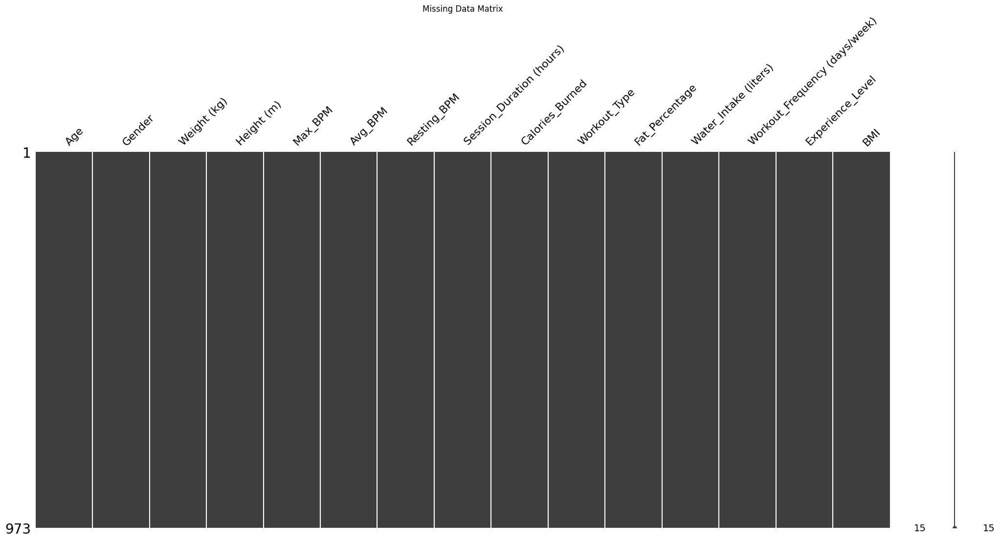

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno

# Plotting the missing data using missingno
plt.figure(figsize=(6, 3))
msno.matrix(data)
plt.title("Missing Data Matrix")
plt.show()

**Missing Data**:
   - There are no missing values in the dataset, which ensures consistency for further analysis.

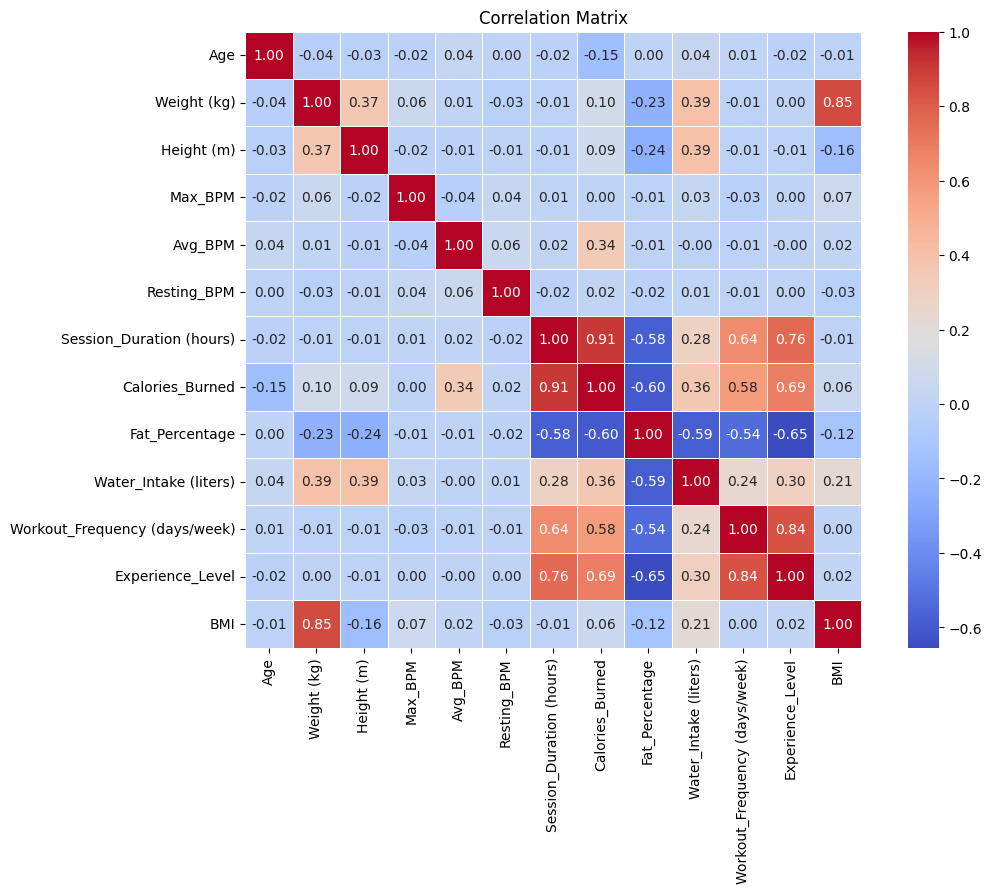

In [5]:
# Selecting only numeric columns for correlation matrix
numeric_data = data.select_dtypes(include=['float64', 'int64'])
correlation_matrix = numeric_data.corr()

# Correlation matrix plot using seaborn heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_data.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5, square=True)
plt.title("Correlation Matrix")
plt.show()


**Correlations**:
   - There is a **strong positive correlation** between workout duration and calories burned ($ r = 0.76 $).
   - Experience level correlates positively with both workout frequency ($ r = 0.84 $) and session duration ($ r = 0.76 $).
   - Fat percentage has a moderate negative correlation with experience level ($ r = -0.65 $), suggesting that more experienced individuals tend to have lower fat percentages.

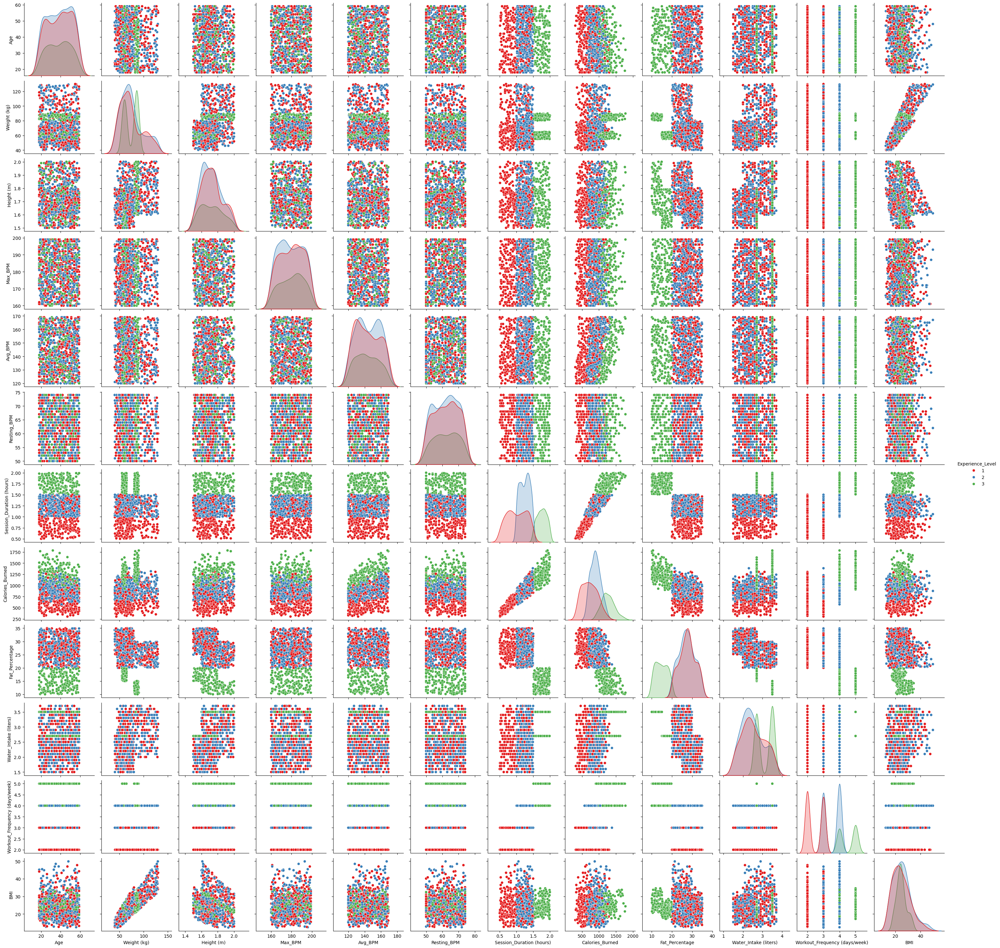

In [6]:
if True:
    # Create the pairplot, colored by the cluster labels
    sns.pairplot(data, hue='Experience_Level', palette='Set1', diag_kind='kde')
    plt.show()


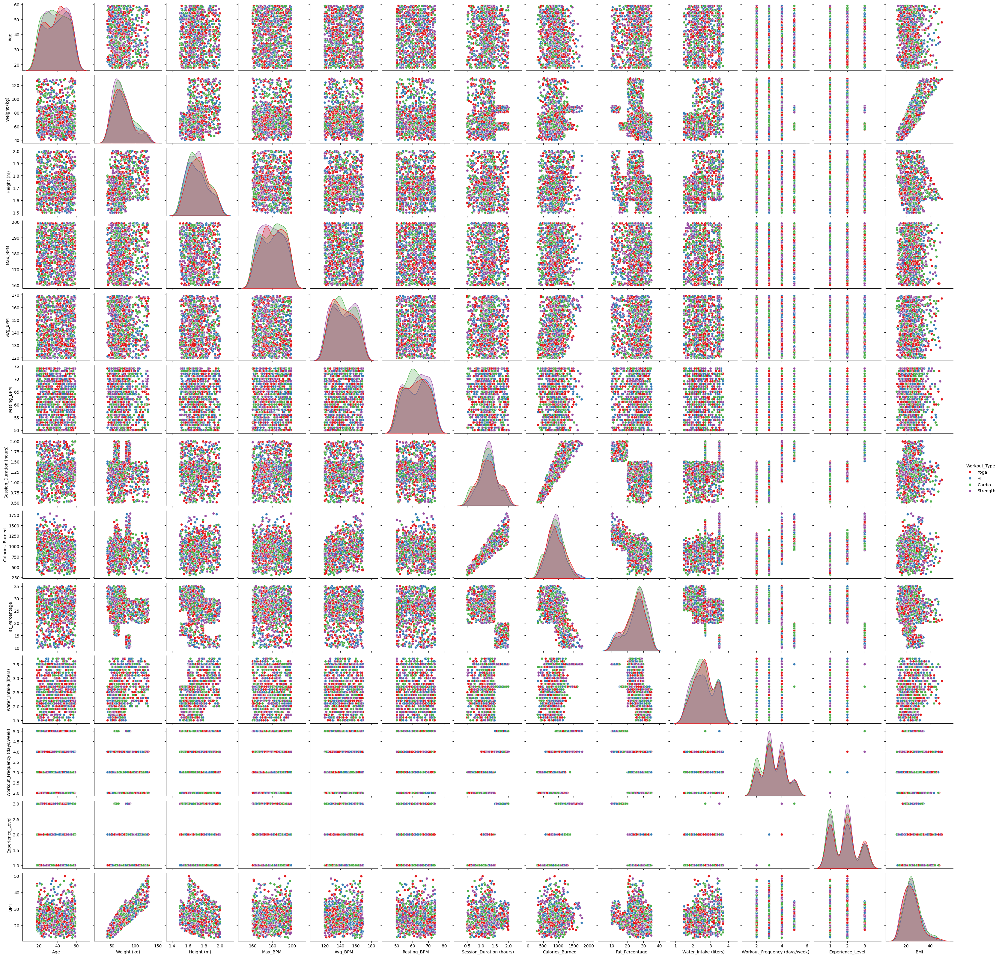

In [7]:
if True:
    # Create the pairplot, colored by the cluster labels
    sns.pairplot(data, hue='Workout_Type', palette='Set1', diag_kind='kde')
    plt.show()


## Plotting the distribution of key variables

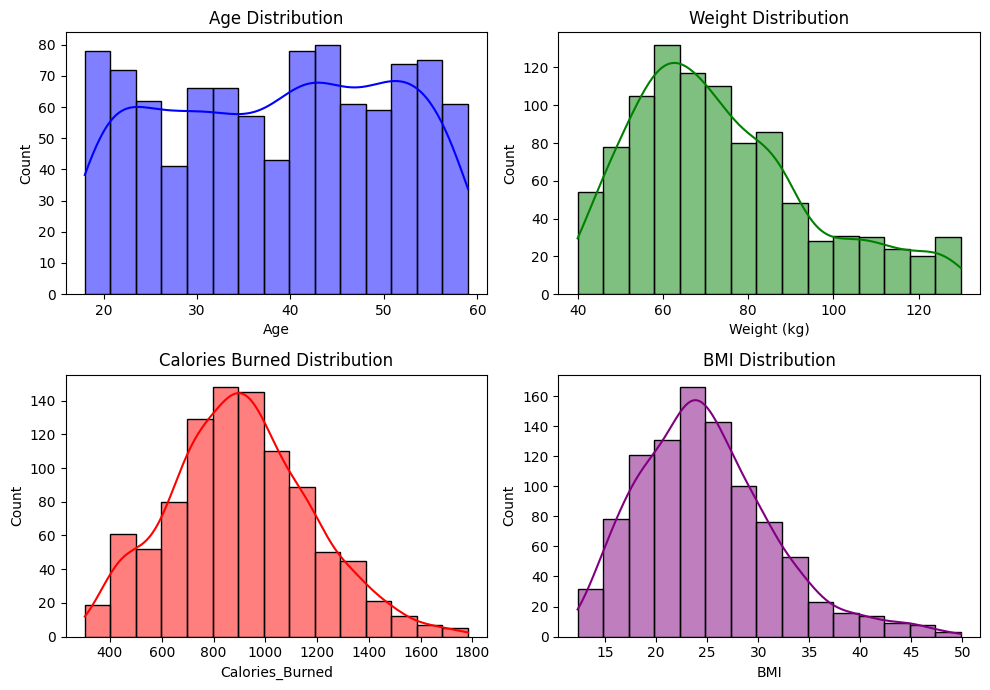

In [8]:
plt.figure(figsize=(10, 7))

# Age distribution
plt.subplot(2, 2, 1)
sns.histplot(data['Age'], bins=15, kde=True, color='blue')
plt.title('Age Distribution')

# Weight distribution
plt.subplot(2, 2, 2)
sns.histplot(data['Weight (kg)'], bins=15, kde=True, color='green')
plt.title('Weight Distribution')

# Calories burned distribution
plt.subplot(2, 2, 3)
sns.histplot(data['Calories_Burned'], bins=15, kde=True, color='red')
plt.title('Calories Burned Distribution')

# BMI distribution
plt.subplot(2, 2, 4)
sns.histplot(data['BMI'], bins=15, kde=True, color='purple')
plt.title('BMI Distribution')

plt.tight_layout()
plt.show()



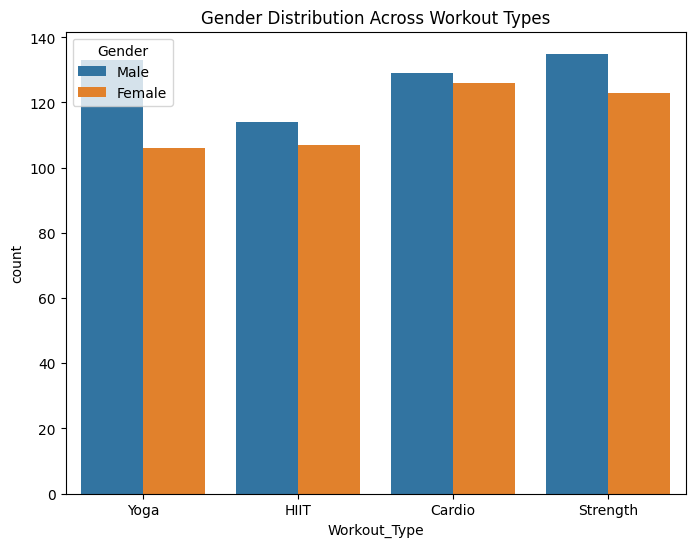

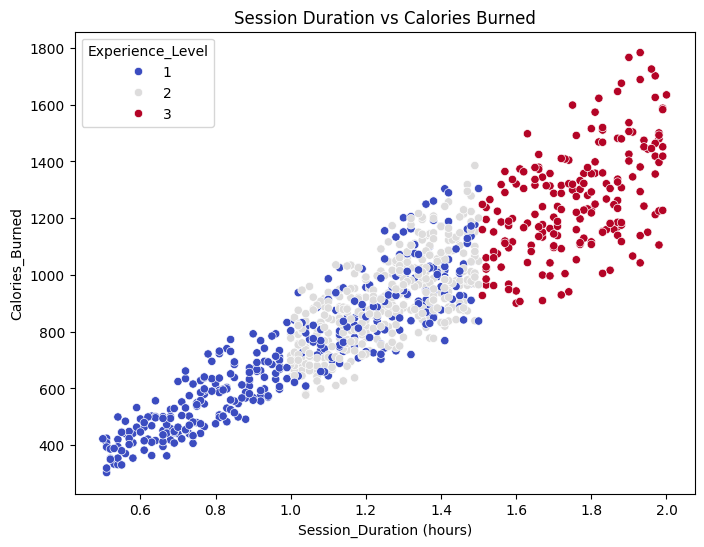

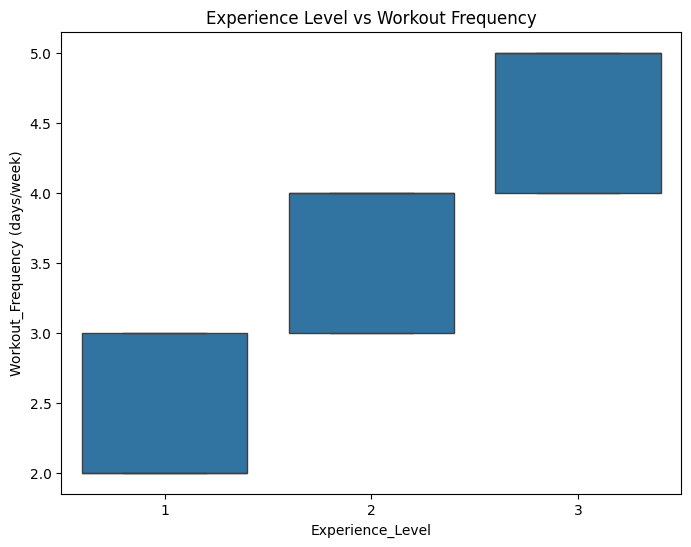

In [9]:
# Gender distribution in workout types
plt.figure(figsize=(8, 6))
sns.countplot(x='Workout_Type', hue='Gender', data=data)
plt.title('Gender Distribution Across Workout Types')
plt.show()

# Relationship between session duration and calories burned
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Session_Duration (hours)', y='Calories_Burned', hue='Experience_Level', data=data, palette='coolwarm')
plt.title('Session Duration vs Calories Burned')
plt.show()

# Experience level vs workout frequency
plt.figure(figsize=(8, 6))
sns.boxplot(x='Experience_Level', y='Workout_Frequency (days/week)', data=data)
plt.title('Experience Level vs Workout Frequency')
plt.show()


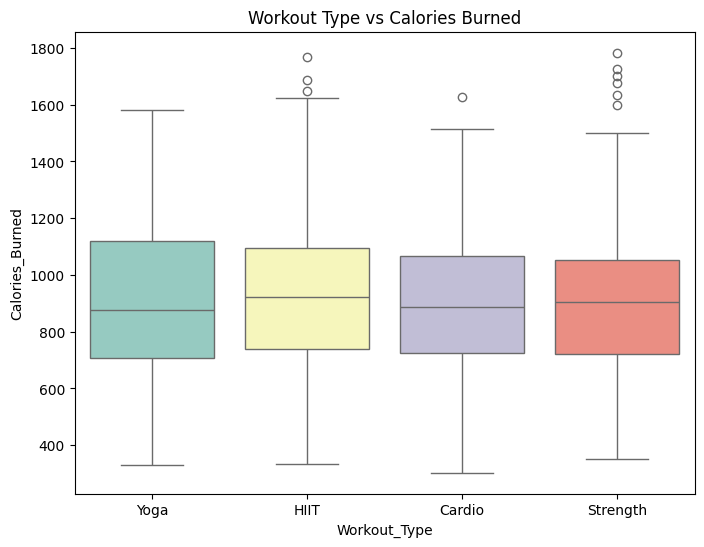

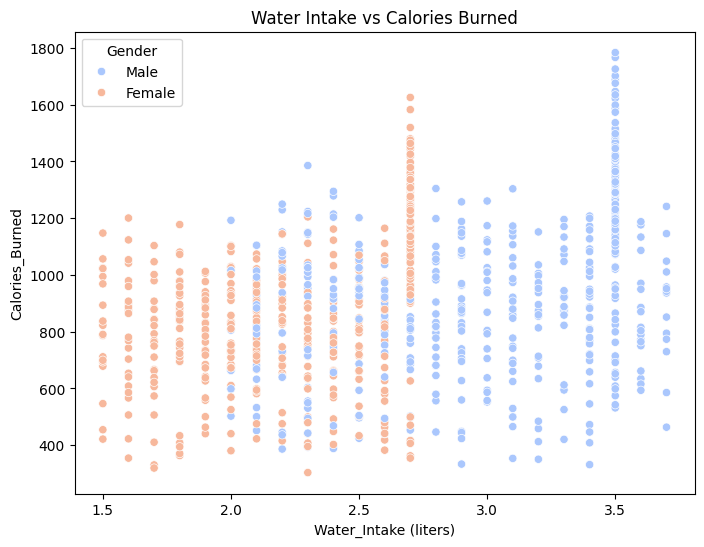

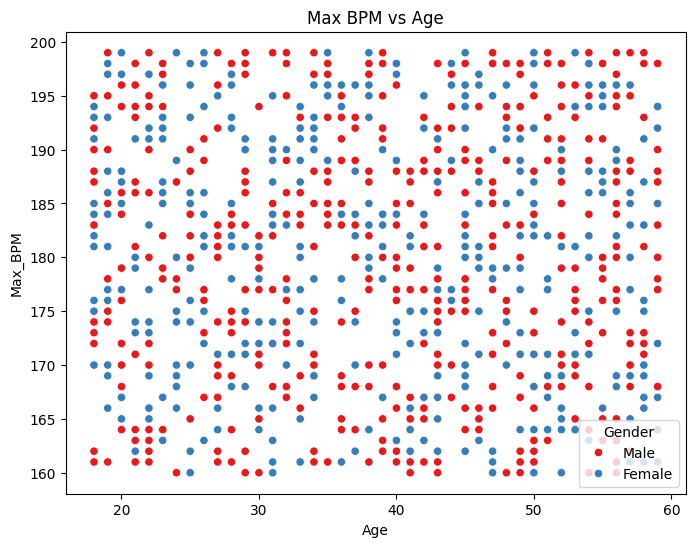

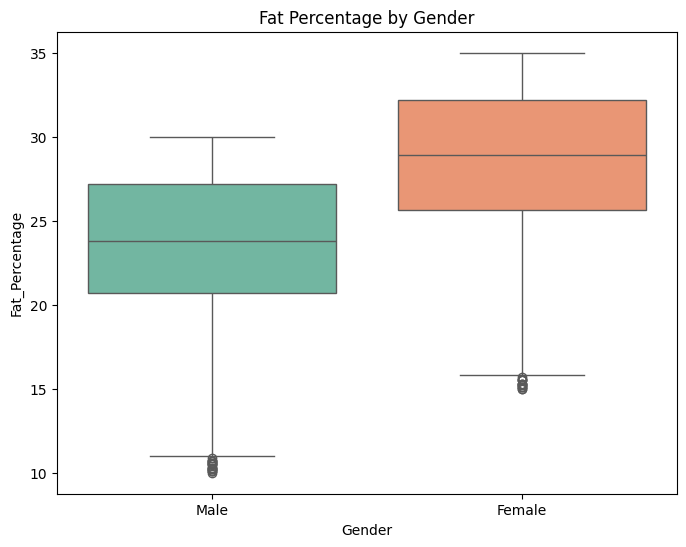

In [10]:
# Workout type vs calories burned
plt.figure(figsize=(8, 6))
sns.boxplot(x='Workout_Type', y='Calories_Burned', data=data, palette='Set3')
plt.title('Workout Type vs Calories Burned')
plt.show()

# Water intake vs calories burned
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Water_Intake (liters)', y='Calories_Burned', hue='Gender', data=data, palette='coolwarm')
plt.title('Water Intake vs Calories Burned')
plt.show()

# Max BPM vs age
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='Max_BPM', hue='Gender', data=data, palette='Set1')
plt.title('Max BPM vs Age')
plt.show()

# Fat percentage by gender
plt.figure(figsize=(8, 6))
sns.boxplot(x='Gender', y='Fat_Percentage', data=data, palette='Set2')
plt.title('Fat Percentage by Gender')
plt.show()


---

## Clustering

Scaling and transformation

In [11]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
import matplotlib.pyplot as plt

In [12]:
# Redefine the column lists for numerical and categorical features
numerical_cols = ['Age', 'Weight (kg)', 'Height (m)', 'Max_BPM', 'Avg_BPM', 'Resting_BPM',
                  'Session_Duration (hours)', 'Calories_Burned', 'Fat_Percentage', 'Water_Intake (liters)', 
                  'Workout_Frequency (days/week)', 'Experience_Level', 'BMI']
categorical_cols = ['Gender', 'Workout_Type']

# Column transformer: Scaling numerical columns with StandardScaler and encoding categorical ones with OneHotEncoder
preprocessor_standard = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ])

# Fit and transform the data with this preprocessing pipeline
data_preprocessed_standard = preprocessor_standard.fit_transform(data)

# Get the original numerical column names
numerical_col_names = numerical_cols

# Get the encoded categorical column names from OneHotEncoder
# You can retrieve the column names like this:
encoded_cat_col_names = preprocessor_standard.named_transformers_['cat'].get_feature_names_out(categorical_cols)

# Combine the numerical and categorical column names
all_col_names = list(numerical_col_names) + list(encoded_cat_col_names)

# Convert the transformed data into a DataFrame and assign the column names
data_preprocessed_standard_df = pd.DataFrame(data_preprocessed_standard, columns=all_col_names)

# Display the first few rows
data_preprocessed_standard_df.head()

,Age,Weight (kg),Height (m),Max_BPM,Avg_BPM,Resting_BPM,Session_Duration (hours),Calories_Burned,Fat_Percentage,Water_Intake (liters),Workout_Frequency (days/week),Experience_Level,BMI,Gender_Female,Gender_Male,Workout_Type_Cardio,Workout_Type_HIIT,Workout_Type_Strength,Workout_Type_Yoga
0,1.422343,0.681493,-0.098545,0.010081,0.922970,-0.303555,1.264598,1.495690,-1.978321,1.455967,0.743295,1.609784,0.794278,0.0,1.0,0.0,0.0,0.0,1.0
1,0.600965,0.049316,-1.508604,-0.076726,0.504494,0.515749,0.127098,-0.082284,1.426301,-0.877898,0.743295,0.257176,1.064652,1.0,0.0,0.0,1.0,0.0,0.0
2,-0.548964,-0.271491,-0.490228,-1.118414,-1.518142,-1.122858,-0.427068,-0.838243,1.346380,-0.544488,0.743295,0.257176,-0.030361,1.0,0.0,1.0,0.0,0.0,0.0
3,-1.123928,-0.974433,-0.176881,0.878155,1.411193,-0.849757,-1.943735,-1.370351,0.611110,-0.877898,-0.352502,-1.095432,-0.976669,0.0,1.0,0.0,0.0,1.0,0.0
4,-0.056137,-1.309393,0.528148,0.704540,0.992716,0.788850,-1.797902,-1.282278,0.675047,0.289035,-0.352502,-1.095432,-1.580503,0.0,1.0,0.0,0.0,1.0,0.0


### **Linkage**

**Linkage** refers to the method used to calculate the distance between clusters during the merging process in hierarchical clustering. There are several types of linkage criteria, and each affects how clusters are formed:

- **Single Linkage (Minimum Distance):**
  - The distance between two clusters is defined as the shortest distance between any two points in the clusters.
  - Tends to form "chained" clusters, which can lead to elongated and loosely connected clusters.
  
- **Complete Linkage (Maximum Distance):**
  - The distance between two clusters is defined as the largest distance between any two points in the clusters.
  - Tends to form more compact clusters compared to single linkage, avoiding long, stringy clusters.

- **Average Linkage:**
  - The distance between two clusters is calculated as the average distance between all pairs of points across the two clusters.
  - A compromise between single and complete linkage, balancing the two approaches.

- **Ward’s Method:**
  - Minimizes the total variance within each cluster. It does this by choosing to merge clusters in a way that minimizes the increase in the sum of squared distances within clusters.
  - This method tends to produce clusters that are relatively equal in size.

In hierarchical clustering, the `linkage` function from libraries like `scipy` is used to compute the pairwise distances between clusters and create a hierarchical tree, called a **dendrogram**. The method of linkage (e.g., Ward’s method, single linkage, complete linkage) dictates how the clusters are formed as the hierarchy grows.

### **fcluster**

**fcluster** is a function that allows us to "cut" the hierarchical tree (dendrogram) into flat clusters. It determines how many clusters you want to form based on a given criterion. Common approaches include:

- **Threshold-based Clustering:**
  - You provide a distance threshold, and the algorithm will cut the dendrogram at this level. All points that are merged within this threshold are grouped into the same cluster.
  - This is useful if you want to control the similarity level (distance) at which clusters stop merging.
  
- **Predefined Number of Clusters:**
  - You can specify the exact number of clusters you want. The `fcluster` function will then cut the dendrogram at a point where this number of clusters is formed.
  - This approach is useful if you know how many clusters you expect or want.


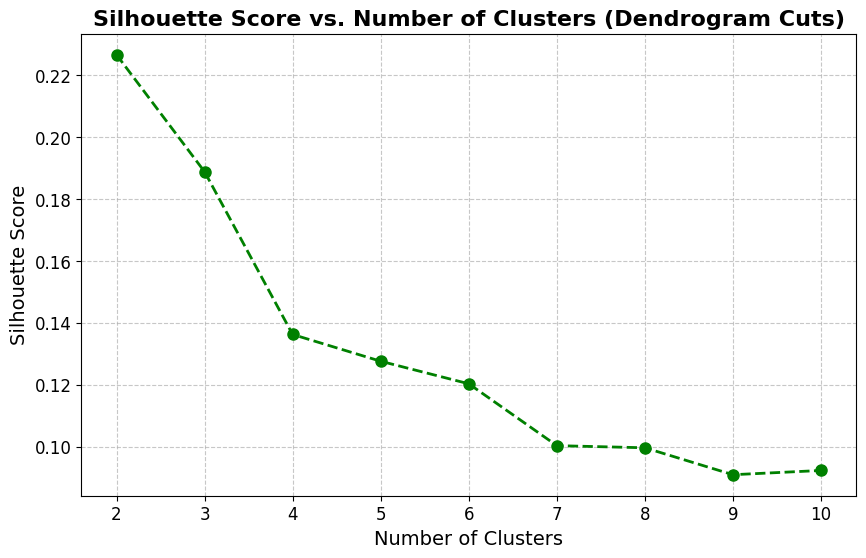

In [13]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.metrics import silhouette_score

# Generate the linkage matrix
Z = linkage(data_preprocessed_standard_df, method='ward')

# Function to calculate and plot silhouette scores for different dendrogram cuts
def silhouette_scores_hierarchical(data, linkage_matrix, max_clusters=10):
    sil_scores = []
    cluster_range = range(2, max_clusters+1)
    
    for n_clusters in cluster_range:
        # Cut the dendrogram at the desired number of clusters
        labels = fcluster(linkage_matrix, n_clusters, criterion='maxclust')
        sil_score = silhouette_score(data, labels)
        sil_scores.append(sil_score)
    
    # Plot silhouette scores for different cuts of the dendrogram
    plt.figure(figsize=(10, 6))
    plt.plot(cluster_range, sil_scores, marker='o', color='g', linestyle='--', linewidth=2, markersize=8)
    plt.title('Silhouette Score vs. Number of Clusters (Dendrogram Cuts)', fontsize=16, fontweight='bold')
    plt.xlabel('Number of Clusters', fontsize=14)
    plt.ylabel('Silhouette Score', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.show()

# Apply the silhouette score analysis to hierarchical clustering
silhouette_scores_hierarchical(data_preprocessed_standard_df, Z, max_clusters=10)


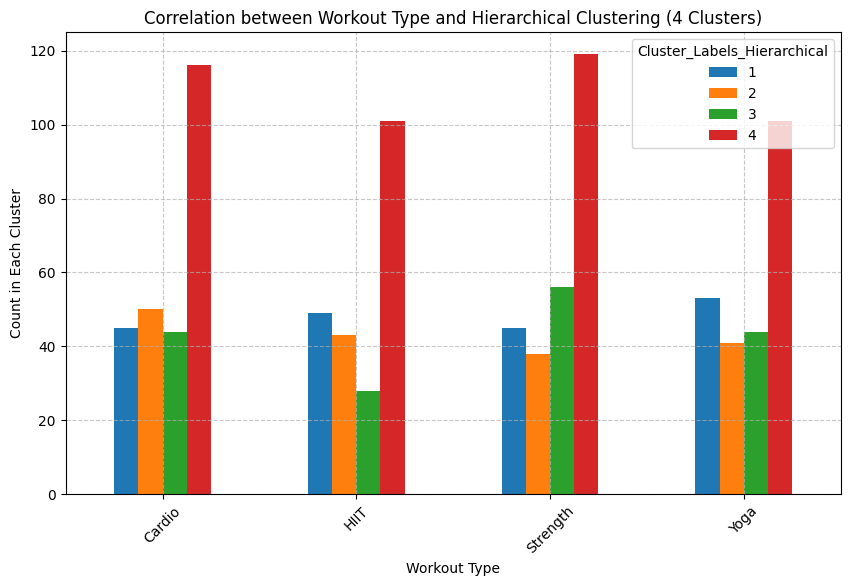

In [14]:
# Cut the dendrogram to get at most 4 clusters
n_clusters_hierarchical = 4
cluster_labels_hierarchical = fcluster(Z, n_clusters_hierarchical, criterion='maxclust')

workout_type_original = data['Workout_Type']

data_hc4 = data_preprocessed_standard_df[:]

# Add the cluster labels to the original data
data_hc4['Cluster_Labels_Hierarchical'] = cluster_labels_hierarchical

# Add the original 'Workout_Type' back to the DataFrame for correlation analysis
data_hc4['Workout_Type'] = workout_type_original.values

# Now, let's check the correlation between workout type and the hierarchical clustering labels
workout_correlation_hierarchical = pd.crosstab(data_hc4['Workout_Type'], data_hc4['Cluster_Labels_Hierarchical'])

# Plot the correlation between workout type and hierarchical cluster labels
workout_correlation_hierarchical.plot(kind='bar', figsize=(10, 6))
plt.title('Correlation between Workout Type and Hierarchical Clustering (4 Clusters)')
plt.xlabel('Workout Type')
plt.ylabel('Count in Each Cluster')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


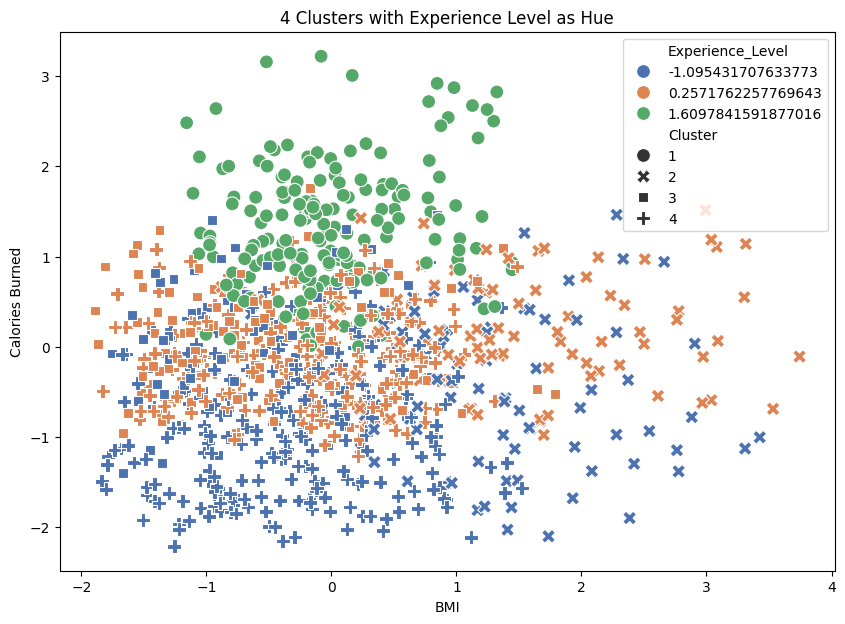

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import fcluster

# Assuming you already have the hierarchical linkage matrix 'Z'
# Now, let's cut the dendrogram to create clusters
clusters = fcluster(Z, 4, criterion='maxclust')

data_hc4 = data_preprocessed_standard_df[:]

# Add the cluster labels to the original dataset
data_hc4['Cluster'] = clusters

# Plotting the clusters using Experience Level as the hue
plt.figure(figsize=(10, 7))

# Example scatter plot between two relevant features, say BMI and Calories_Burned
sns.scatterplot(
    x=data_hc4['BMI'], 
    y=data_hc4['Calories_Burned'], 
    hue=data_hc4['Experience_Level'], 
    style=data_hc4['Cluster'],  # Different markers for different clusters
    palette="deep", 
    s=100
)

plt.title('4 Clusters with Experience Level as Hue')
plt.xlabel('BMI')
plt.ylabel('Calories Burned')
plt.legend()
plt.show()


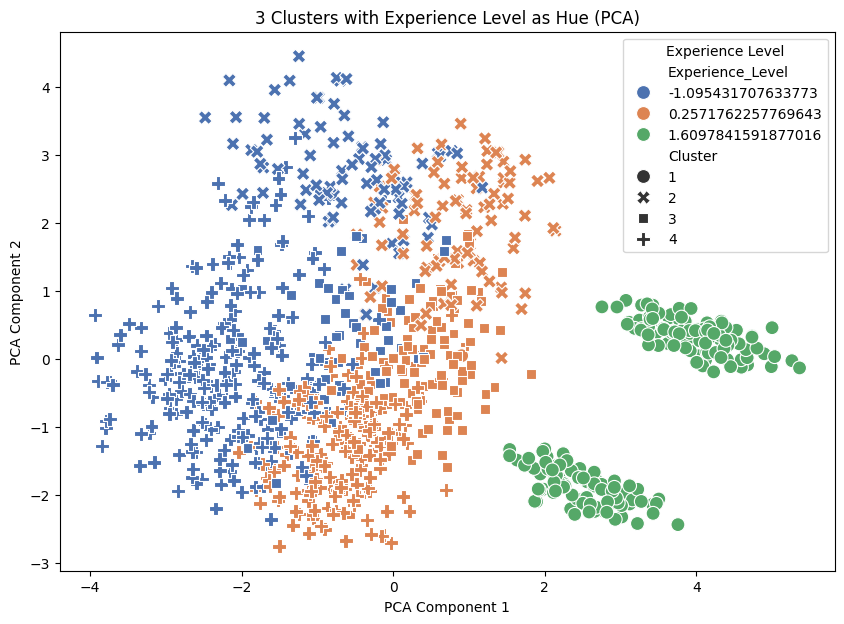

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import fcluster
from sklearn.decomposition import PCA

# Assuming you already have the hierarchical linkage matrix 'Z'
# Cut the dendrogram to create clusters (for 3 clusters as an example)
clusters = fcluster(Z, 4, criterion='maxclust')

# Create a copy of the original dataset to work with
data_hc4 = data_preprocessed_standard_df[:]

# Add the cluster labels to the original dataset
data_hc4['Cluster'] = clusters

# Apply PCA to reduce the dimensions to 2 components
pca = PCA(n_components=2)
pca_components = pca.fit_transform(data_preprocessed_standard_df)

# Add PCA components to the dataset for plotting
data_hc4['PCA1'] = pca_components[:, 0]
data_hc4['PCA2'] = pca_components[:, 1]

# Plotting the clusters using Experience Level as the hue
plt.figure(figsize=(10, 7))

# Use PCA components as x and y for the scatter plot
sns.scatterplot(
    x=data_hc4['PCA1'], 
    y=data_hc4['PCA2'], 
    hue=data_hc4['Experience_Level'], 
    style=data_hc4['Cluster'],  # Different markers for different clusters
    palette="deep", 
    s=100
)

plt.title('3 Clusters with Experience Level as Hue (PCA)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.legend(title='Experience Level')
plt.show()


In [17]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import pandas as pd

# Selecting the relevant numerical columns from the original dataset
numerical_columns = [
    'Age', 'Weight (kg)', 'Height (m)', 'Max_BPM', 'Avg_BPM', 'Resting_BPM',
    'Session_Duration (hours)', 'Calories_Burned', 'Fat_Percentage',
    'Water_Intake (liters)', 'Workout_Frequency (days/week)', 'Experience_Level', 'BMI'
]

# Standardize the data
scaler = StandardScaler()
dps = scaler.fit_transform(data[numerical_columns])

# Apply PCA
pca = PCA(n_components=2)
pca_components = pca.fit_transform(dps)

# Extracting the principal components (the direction of maximum variance)
pca_df = pd.DataFrame(pca.components_, columns=numerical_columns, index=['PCA1', 'PCA2'])

# Sorting the features by their absolute values for PCA1 and PCA2 separately
pca1_sorted = pca_df.loc['PCA1'].abs().sort_values(ascending=False)
pca2_sorted = pca_df.loc['PCA2'].abs().sort_values(ascending=False)

# Display the sorted results for PCA1 and PCA2
print("PCA1 Sorted Contributions:")
print(pca1_sorted)

print("\nPCA2 Sorted Contributions:")
print(pca2_sorted)


PCA1 Sorted Contributions:
Experience_Level                 0.438732
Calories_Burned                  0.436992
Session_Duration (hours)         0.433265
Fat_Percentage                   0.409566
Workout_Frequency (days/week)    0.393348
Water_Intake (liters)            0.279375
Weight (kg)                      0.110269
Height (m)                       0.086268
BMI                              0.073762
Avg_BPM                          0.051031
Age                              0.025391
Max_BPM                          0.004916
Resting_BPM                      0.001140
Name: PCA1, dtype: float64

PCA2 Sorted Contributions:
Weight (kg)                      0.645982
BMI                              0.536594
Water_Intake (liters)            0.324463
Height (m)                       0.271369
Session_Duration (hours)         0.179264
Workout_Frequency (days/week)    0.177892
Experience_Level                 0.167962
Calories_Burned                  0.092332
Fat_Percentage                   0.0

- **PCA1**: Significant contributions come from **Session_Duration**, **Calories_Burned**, and **Experience_Level**.
- **PCA2**: Heavily influenced by **Weight (kg)**, **BMI**, and **Water_Intake (liters)**.

In [18]:
# Select only numeric columns for calculating the mean
numeric_data = data.select_dtypes(include=['float64', 'int64'])

data['Cluster'] = data_hc4['Cluster']

# Calculate the mean values of the numeric variables for each cluster
cluster_means_4 = numeric_data.groupby(data['Cluster']).mean()

# Display the mean values to compare the differences between clusters
cluster_means_4.T


Cluster,1,2,3,4
Age,38.192708,36.610465,42.453488,38.231121
Weight (kg),73.447396,108.523837,67.174419,63.017391
Height (m),1.724271,1.794826,1.789651,1.667002
Max_BPM,180.286458,181.854651,179.377907,179.130435
Avg_BPM,143.192708,142.220930,147.674419,143.089245
Resting_BPM,62.348958,62.122093,62.151163,62.235698
Session_Duration (hours),1.757135,1.155988,1.230233,1.086270
Calories_Burned,1263.854167,869.895349,931.331395,751.727689
Fat_Percentage,14.823958,24.948837,25.167442,29.373455
Water_Intake (liters),3.120313,2.930233,2.865698,2.196110


### **Cluster 1:**
- **Age**: 38.19 (Average)
- **Weight**: 73.45 kg (Moderate weight)
- **BMI**: 24.77 (Healthy range)
- **Session Duration**: 1.76 hours (Longest average session)
- **Calories Burned**: 1263.85 (Highest among clusters)
- **Experience Level**: 2.99 (Most experienced group)
- **Water Intake**: 3.12 liters (Highest water intake)

This cluster seems to represent members who have longer workouts, burn more calories, and are more experienced in terms of workout frequency.

---

### **Cluster 2:**
- **Age**: 36.61 (Slightly younger)
- **Weight**: 108.52 kg (Heaviest)
- **BMI**: 34.11 (Significantly higher, indicating obesity)
- **Session Duration**: 1.16 hours (Shorter sessions)
- **Calories Burned**: 869.90 (Moderate calories burned)
- **Fat Percentage**: 24.95 (Relatively high)

Cluster 2 consists of individuals with higher body weight and BMI, shorter workout durations, and moderate calorie burns. This group might need different workout goals, such as weight loss or cardiovascular training.

---

### **Cluster 3:**
- **Age**: 42.45 (Oldest group)
- **Weight**: 67.17 kg (Light weight)
- **BMI**: 21.16 (On the lower end, considered lean)
- **Session Duration**: 1.23 hours (Moderate duration)
- **Calories Burned**: 931.33 (Average calories burned)
- **Fat Percentage**: 25.17 (Moderate)

Cluster 3 represents older individuals with a relatively lean body type and moderate workout intensity.

---

### **Cluster 4:**
- **Age**: 38.23 (Similar to Cluster 1)
- **Weight**: 63.02 kg (Lowest weight)
- **BMI**: 22.83 (Healthy range)
- **Session Duration**: 1.09 hours (Shortest average session)
- **Calories Burned**: 751.73 (Lowest calories burned)
- **Experience Level**: 1.46 (Least experienced group)
- **Fat Percentage**: 29.37 (Highest among clusters)

Cluster 4 seems to include less experienced gym-goers, with lower body weight and shorter workout sessions, indicating potential beginners or casual exercisers.

---

### Key Insights:
- **Cluster 1** is characterized by the highest workout frequency, calorie burn, and experience level, indicating highly active individuals.
- **Cluster 2** stands out due to the highest weight, BMI, and fat percentage, suggesting a group that may benefit from more weight-focused fitness regimes.
- **Cluster 3** has older, leaner individuals with moderate workout intensity.
- **Cluster 4** shows a mix of lower experience, shorter sessions, and higher fat percentage, indicating beginners or those focusing on lighter exercises.

---

Can we understand if is this clear in the following chart?

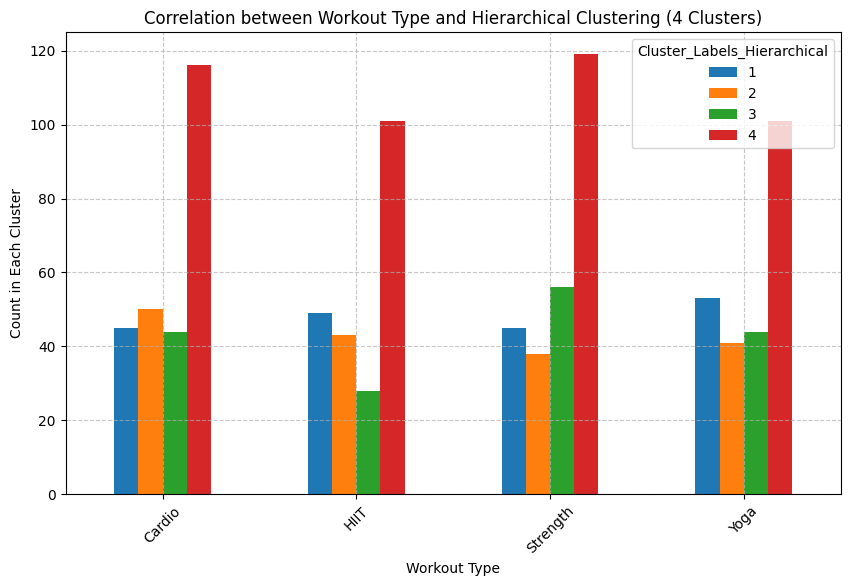

In [19]:
# Plot the correlation between workout type and hierarchical cluster labels
workout_correlation_hierarchical.plot(kind='bar', figsize=(10, 6))
plt.title('Correlation between Workout Type and Hierarchical Clustering (4 Clusters)')
plt.xlabel('Workout Type')
plt.ylabel('Count in Each Cluster')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

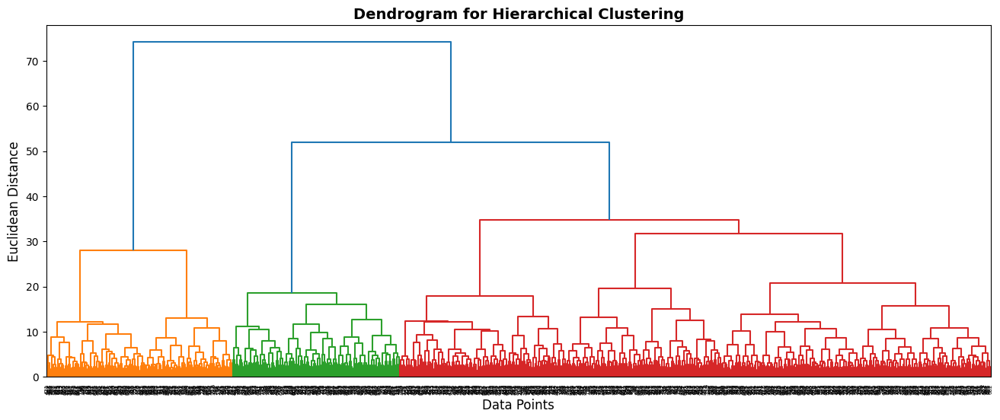

In [20]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram

# Plot the dendrogram for the clustering with 4 clusters
plt.figure(figsize=(16, 6))

# Plot the dendrogram
dendrogram(Z)

# Customize the plot aesthetics
plt.title('Dendrogram for Hierarchical Clustering', fontsize=14, weight='bold')
plt.xlabel('Data Points', fontsize=12)
plt.ylabel('Euclidean Distance', fontsize=12)

# Remove grey background and grid for a cleaner look
plt.gca().set_facecolor('white')
plt.grid(False)

# Show the final plot
plt.show()


### Anything strange? -> Let's try with 3 clusters

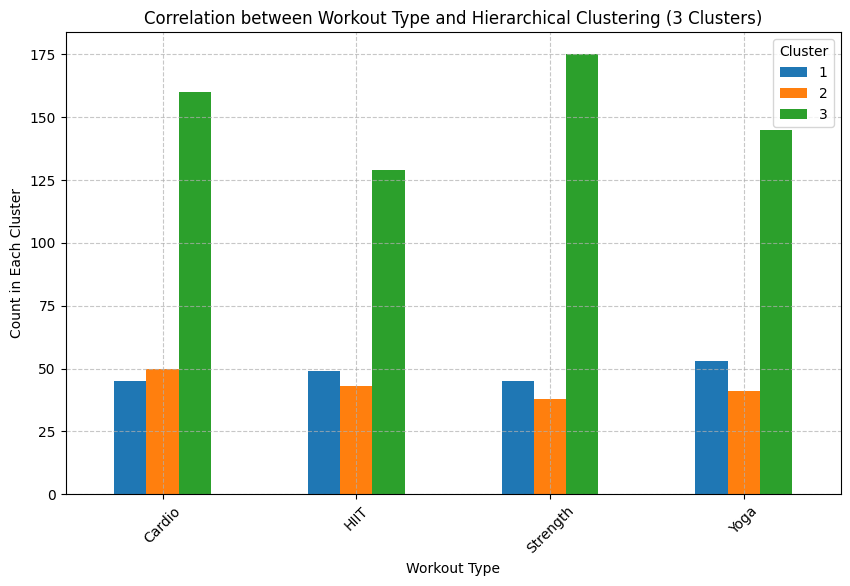

In [21]:
# Cut the dendrogram to get at most 3 clusters
n_clusters_hierarchical = 3
cluster_labels_hierarchical = fcluster(Z, n_clusters_hierarchical, criterion='maxclust')

workout_type_original = data['Workout_Type']

data_hc3 = data_preprocessed_standard_df[:]

# Add the cluster labels to the original data
data_hc3['Cluster'] = cluster_labels_hierarchical

# Add the original 'Workout_Type' back to the DataFrame for correlation analysis
data_hc3['Workout_Type'] = workout_type_original.values

# Now, let's check the correlation between workout type and the hierarchical clustering labels
workout_correlation_hierarchical = pd.crosstab(data_hc3['Workout_Type'], data_hc3['Cluster'])

# Plot the correlation between workout type and hierarchical cluster labels
workout_correlation_hierarchical.plot(kind='bar', figsize=(10, 6))
plt.title('Correlation between Workout Type and Hierarchical Clustering (3 Clusters)')
plt.xlabel('Workout Type')
plt.ylabel('Count in Each Cluster')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()


#### **Cluster 1:**
- **Age**: 38.19 (Average)
- **Weight**: 73.45 kg (Moderate)
- **BMI**: 24.77 (Healthy range)
- **Session Duration**: 1.76 hours (Longest sessions)
- **Calories Burned**: 1263.85 (Highest calorie burn)
- **Experience Level**: 2.99 (Most experienced)
- **Workout Frequency**: 4.53 days/week (Most frequent)
- **Water Intake**: 3.12 liters (Highest)

This cluster represents highly active individuals who work out more frequently and burn more calories. Their long session durations suggest dedicated fitness enthusiasts.

#### **Cluster 2:**
- **Age**: 36.61 (Slightly younger)
- **Weight**: 108.52 kg (Heaviest)
- **BMI**: 34.11 (Indicating obesity)
- **Session Duration**: 1.16 hours (Moderate)
- **Calories Burned**: 869.90 (Moderate)
- **Fat Percentage**: 24.95 (Relatively high)
- **Workout Frequency**: 2.95 days/week (Less frequent)

This cluster includes individuals with higher BMI, shorter workouts, and lower calorie burns. These members may benefit from weight loss or cardiovascular fitness routines.

#### **Cluster 3:**
- **Age**: 39.42 (Oldest group)
- **Weight**: 64.19 kg (Lightest)
- **BMI**: 22.36 (Healthy/lean)
- **Session Duration**: 1.13 hours (Shortest sessions)
- **Calories Burned**: 802.45 (Lowest)
- **Fat Percentage**: 28.18 (High, despite lower weight)
- **Workout Frequency**: 3.04 days/week (Average frequency)
  
This group includes individuals with lower body weight but higher fat percentages, indicating a need for body composition improvement. They tend to have shorter workout sessions and burn fewer calories.

### Key Insights:
- **Cluster 1** includes more experienced individuals with longer workout sessions and higher calorie burns, representing dedicated gym-goers.
- **Cluster 2** stands out due to significantly higher weight, BMI, and fat percentage, indicating a group that may focus on weight loss.
- **Cluster 3** has lighter individuals with lower calorie burns but higher fat percentage, suggesting a focus on muscle gain or fat reduction.

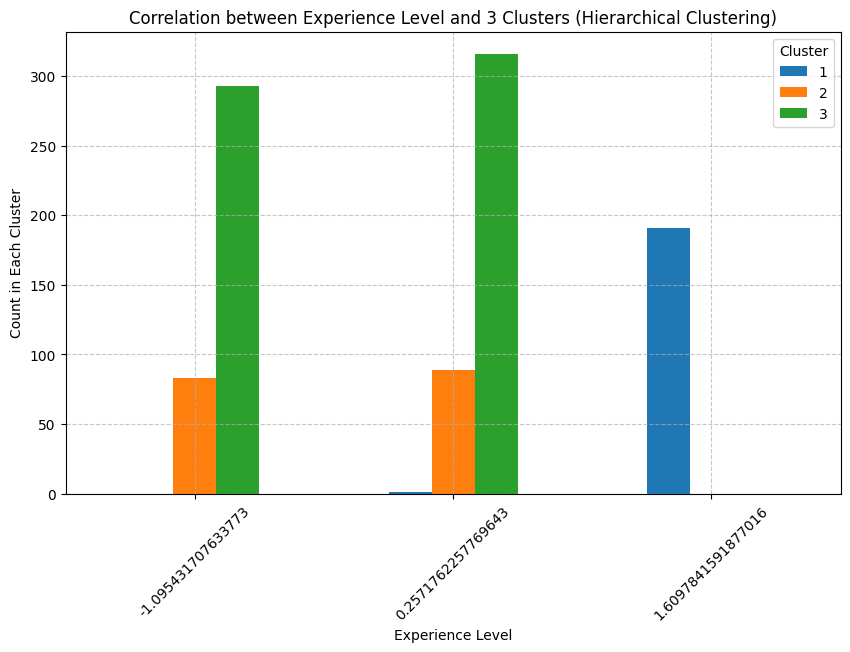

Cluster,1,2,3
Age,38.192708,36.610465,39.423645
Weight (kg),73.447396,108.523837,64.191461
Height (m),1.724271,1.794826,1.701642
Max_BPM,180.286458,181.854651,179.200328
Avg_BPM,143.192708,142.220930,144.384236
Resting_BPM,62.348958,62.122093,62.211823
Session_Duration (hours),1.757135,1.155988,1.126929
Calories_Burned,1263.854167,869.895349,802.453202
Fat_Percentage,14.823958,24.948837,28.185550
Water_Intake (liters),3.120313,2.930233,2.385222


In [22]:
# Check the correlation between experience level and the 3-cluster labels
experience_correlation_3 = pd.crosstab(data_hc3['Experience_Level'], data_hc3['Cluster'])

# Plot the correlation between experience level and the 3-cluster labels
experience_correlation_3.plot(kind='bar', figsize=(10, 6))
plt.title('Correlation between Experience Level and 3 Clusters (Hierarchical Clustering)')
plt.xlabel('Experience Level')
plt.ylabel('Count in Each Cluster')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

data['Cluster'] = data_hc3['Cluster']

# Calculate the mean values of the numeric variables for each cluster
cluster_means_3 = numeric_data.groupby(data['Cluster']).mean()

# Display the mean values to compare the differences between clusters
cluster_means_3.T


---
---
### Let's make now some classification

In [23]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score

# Define the features (X) and the target variable (y)
X_new = data.drop('Experience_Level', axis=1)  # Features
y_new = data['Experience_Level']  # Target: Experience Level

# Identify numerical and categorical columns
numerical_cols = ['Age', 'Weight (kg)', 'Height (m)', 'Max_BPM', 'Avg_BPM', 'Resting_BPM', 
                  'Session_Duration (hours)', 'Calories_Burned', 'Fat_Percentage', 'Water_Intake (liters)', 
                  'Workout_Frequency (days/week)', 'BMI']
categorical_cols = ['Gender', 'Workout_Type']

# Preprocessing pipeline: Scale numerical columns and encode categorical ones
preprocessor_new = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_cols),
        ('cat', OneHotEncoder(), categorical_cols)
    ])

# Train-Test Split
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new, y_new, test_size=0.2, random_state=42)

# Create a pipeline that includes preprocessing and RandomForest classifier
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor_new),
    ('classifier', RandomForestClassifier(random_state=42))
])

# Perform 5-fold cross-validation on the Random Forest classifier
cv_scores_new = cross_val_score(pipeline, X_train_new, y_train_new, cv=5)

# Fit the model to the training data and evaluate on the test set
pipeline.fit(X_train_new, y_train_new)
y_pred_new = pipeline.predict(X_test_new)

from sklearn.metrics import accuracy_score

# Output cross-validation scores and classification accuracy again
cv_scores_new, cv_scores_new.mean(), accuracy_score(y_test_new, y_pred_new)



(array([0.91025641, 0.87179487, 0.91666667, 0.85806452, 0.87096774]),
 0.885550041356493,
 0.8923076923076924)

In [24]:
from sklearn.metrics import classification_report

# Generate the classification report for the test set predictions
classification_report_output = classification_report(y_test_new, y_pred_new)

# Print the classification report
print(classification_report_output)


              precision    recall  f1-score   support

           1       0.90      0.82      0.86        78
           2       0.83      0.91      0.87        75
           3       1.00      1.00      1.00        42

    accuracy                           0.89       195
   macro avg       0.91      0.91      0.91       195
weighted avg       0.89      0.89      0.89       195



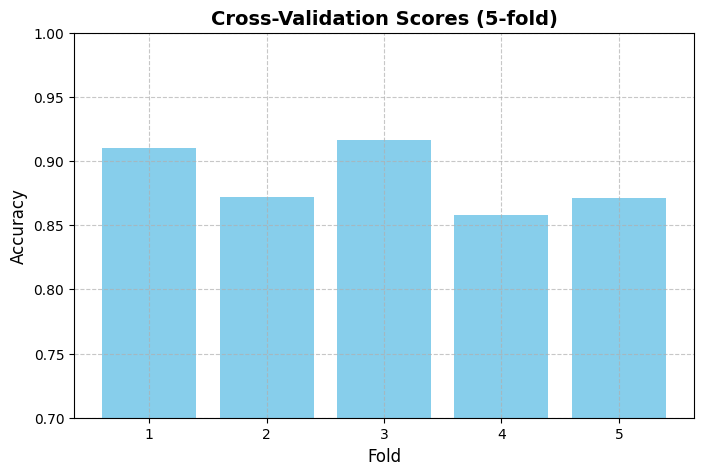

Test Set Accuracy: 0.8923


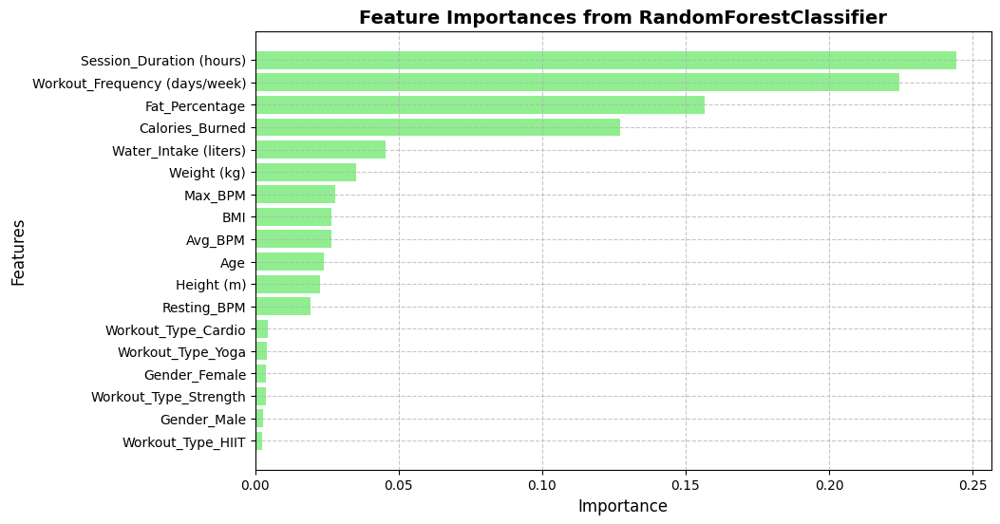

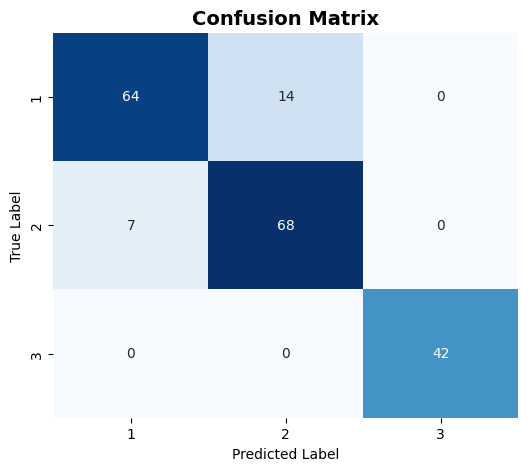

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import accuracy_score, confusion_matrix
import numpy as np

# Perform 5-fold cross-validation on the Random Forest classifier
cv_scores_new = cross_val_score(pipeline, X_train_new, y_train_new, cv=5)

# Fit the model to the training data and evaluate on the test set
pipeline.fit(X_train_new, y_train_new)
y_pred_new = pipeline.predict(X_test_new)

# Visualize Cross-Validation Scores
plt.figure(figsize=(8, 5))
plt.bar(range(1, 6), cv_scores_new, color='skyblue')
plt.title('Cross-Validation Scores (5-fold)', fontsize=14, weight='bold')
plt.xlabel('Fold', fontsize=12)
plt.ylabel('Accuracy', fontsize=12)
plt.ylim(0.7, 1)  # Set y-axis limits for better visualization
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Calculate the accuracy
accuracy = accuracy_score(y_test_new, y_pred_new)
print(f"Test Set Accuracy: {accuracy:.4f}")

# Visualize Feature Importance from the RandomForestClassifier
# Extract feature importance from the classifier
rf_model = pipeline.named_steps['classifier']
feature_importances = rf_model.feature_importances_

# Get feature names (after transformation)
encoded_feature_names = pipeline.named_steps['preprocessor'].named_transformers_['cat'].get_feature_names_out(categorical_cols)
all_feature_names = numerical_cols + list(encoded_feature_names)

# Create a bar plot for feature importances
sorted_idx = np.argsort(feature_importances)[::-1]
plt.figure(figsize=(10, 6))
plt.barh(np.array(all_feature_names)[sorted_idx], feature_importances[sorted_idx], color='lightgreen')
plt.title('Feature Importances from RandomForestClassifier', fontsize=14, weight='bold')
plt.xlabel('Importance', fontsize=12)
plt.ylabel('Features', fontsize=12)
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.grid(True, linestyle='--', alpha=0.7)
plt.show()

# Confusion Matrix Visualization
conf_matrix = confusion_matrix(y_test_new, y_pred_new)
plt.figure(figsize=(6, 5))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=pipeline.classes_, yticklabels=pipeline.classes_)
plt.title('Confusion Matrix', fontsize=14, weight='bold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()



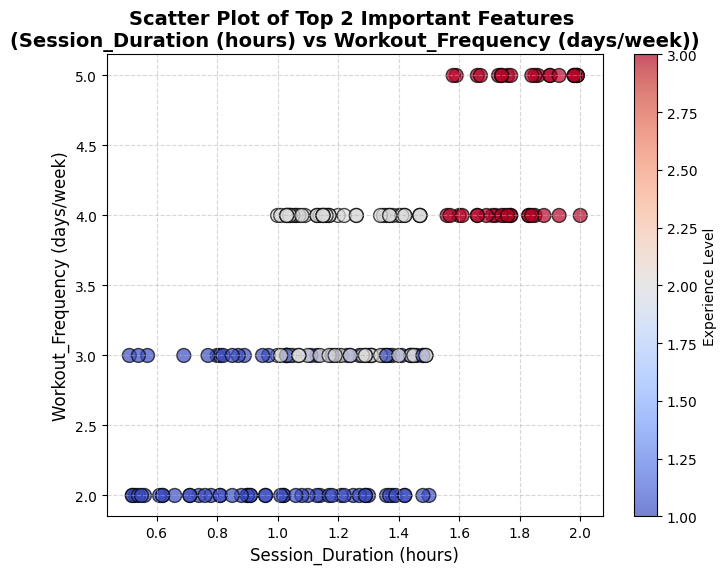

In [26]:
# Select the two most important features for the scatter plot based on feature importance
top_two_idx = sorted_idx[:2]  # Indices of the top two features
top_two_features = np.array(all_feature_names)[top_two_idx]

# Extract these two features from the dataset
X_train_top_two = X_train_new[top_two_features]
X_test_top_two = X_test_new[top_two_features]

# Plot the scatter plot for the test set predictions using the top two features
plt.figure(figsize=(8, 6))
plt.scatter(X_test_top_two.iloc[:, 0], X_test_top_two.iloc[:, 1], c=y_test_new, cmap='coolwarm', edgecolor='k', s=100, alpha=0.7)
plt.title(f'Scatter Plot of Top 2 Important Features \n({top_two_features[0]} vs {top_two_features[1]})', fontsize=14, weight='bold')
plt.xlabel(top_two_features[0], fontsize=12)
plt.ylabel(top_two_features[1], fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)
plt.colorbar(label='Experience Level')
plt.show()
